## Proces ryzyka

In [3]:
function heaviside(t, x0)
   return 0.5 * (sign(t - x0) + 1)
end

heaviside (generic function with 1 method)

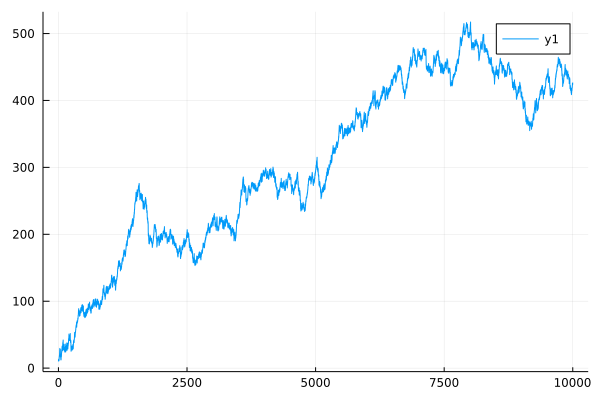

In [207]:
λ = 2
β = 1
θ = 0.01
T = 10000
u = 10
c = (1 + θ) * λ/β

n = rand(Poisson(λ*T))
τ = rand(Uniform(0, T), n)
X = rand(Exponential(1/β), n)
R(t) = u + c*t - sum(X .* heaviside.(t, τ))

xs = 0:1:T
plot(xs, R.(xs))

In [22]:
function Ψ(u, N)
    β1 = 1
    β2 = 2
    u = 10
    Z = 0
    p = 1/3
    θ = 0.2
    for i in 1:N
        K = rand(Geometric(θ/(1 + θ)))
        k = rand(Binomial(K, p))
        Y1 = rand(Exponential(1/β1), k)
        Y2 = rand(Exponential(1/β2), K - k)
        Y = vcat(Y1, Y2)
        if sum(Y) > u
            Z += 1
        end
    end

    return Z/N
end

Ψ(10, 1000)

0.068

## 
## 
## Raport

In [1]:
using Plots
using StatsBase
using Distributions
using StatsFuns
using KernelDensity
using Statistics
using StatsPlots
using LaTeXStrings
using CSV
using DataFrames
using HypothesisTests

In [2]:
file = open("data.txt")
lines = readlines(file)
close(file)

In [3]:
data = parse.(Float64, lines)
data = reshape(data, (10001, 50))

10001×50 Matrix{Float64}:
   50.0      50.0      50.0       50.0     …    50.0       50.0       50.0
   50.5625   50.5625   50.5625    50.5625       50.5625    50.5625    50.5625
   51.125    51.125    51.125     51.125        51.125     51.125     51.125
   51.6875   51.6875   51.6875    51.6875       51.6875    51.6875    51.6875
   52.25     52.25     52.25      52.25         52.25      52.25      52.25
   52.8125   52.8125   52.8125    52.8125  …    52.8125    52.8125    52.8125
   53.375    53.375    53.375     53.375        53.375     53.375     53.375
   53.9375   53.9375   53.9375    53.9375       53.9375    53.9375    53.9375
   54.5      54.5      54.5       54.5          54.5       54.5       54.5
   55.0625   55.0625   55.0625    55.0625       55.0625    55.0625    55.0625
   55.625    55.625    55.625     55.625   …    55.625     55.625     55.625
   56.1875   56.1875   56.1875    56.1875       56.1875    56.1875    56.1875
   27.5536   56.75     56.75      56.75         5

In [5]:
plot()
for i in 1:50
    R = data[:,i]
    plot!(0:0.01:100, R, legend=false, alpha=0.6)
end
plot!(xlabel=L"t", ylabel=L"R_t") |> display

plt = plot!(dpi=500)
savefig(plt, "../fig/trajektorie_1.pdf")

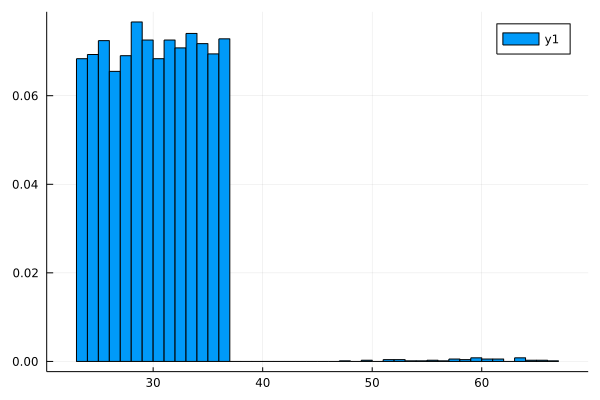

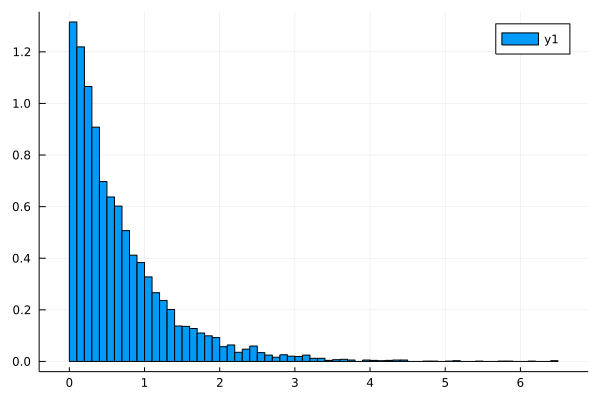

In [6]:
X = Float64[]
T = Float64[]

for col in 1:50
    τ = 0
    for i in 2:10001
        Δ = data[i-1, col] - data[i, col]
        τ += 1
        if Δ > 0
            append!(X, Δ + 0.5625)
            append!(T, τ * 0.01)
            τ = 0
        end
    end
end

histogram(X, normed=true) |> display
histogram(T, normed=true)

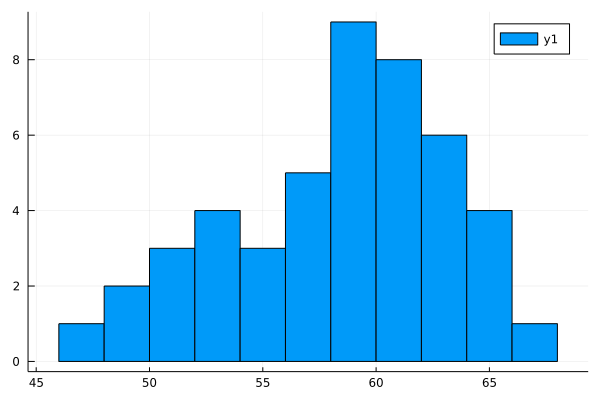

In [7]:
Y = [x for x in X if x > 40]
histogram(Y, bins=10)

In [8]:
X_data = CSV.read("Xi.csv", DataFrame)
Xi = X_data.X

T_data = CSV.read("Ti.csv", DataFrame)
Ti = T_data.T

7358-element Vector{Float64}:
 0.11999999999999998
 0.34000000000000014
 0.9600000000000006
 0.9800000000000006
 1.1900000000000008
 1.9700000000000015
 0.18000000000000002
 0.19000000000000003
 1.7000000000000013
 0.9800000000000006
 1.1600000000000008
 0.060000000000000005
 0.6800000000000004
 ⋮
 0.4000000000000002
 0.8800000000000006
 0.7700000000000005
 1.7800000000000014
 0.5300000000000002
 0.05
 0.09
 0.13999999999999999
 0.49000000000000027
 0.8500000000000005
 0.7800000000000005
 1.440000000000001

In [11]:
c = (data[2, 1] - data[1, 1]) * 100
μ = mean(Xi)
λ = 1/mean(Ti)
θ = c / (μ * λ) - 1

println("c = ", c)
println("μ = ", μ)
println("λ = ", λ)
println("θ = ", θ)

c = 56.25
μ = 30.231343882787424
λ = 1.4812130728427506
θ = 0.25616745367375415


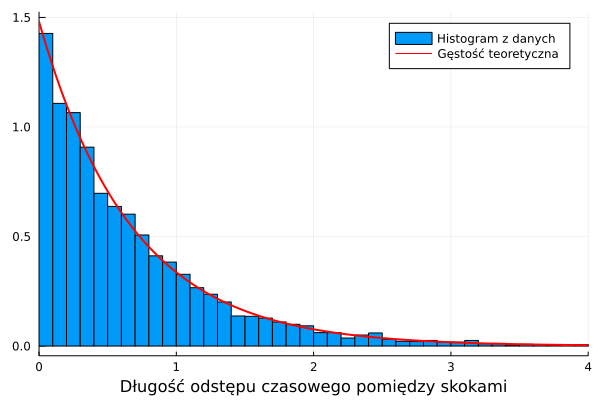

In [13]:
histogram(Ti, normed=true, label="Histogram z danych")

xs = 0:0.01:4
plot!(xs, pdf.(Exponential(1/λ), xs), width=2, color=:red, label="Gęstość teoretyczna", xlims=(0, 4), xlabel="Długość odstępu czasowego pomiędzy skokami") |> display

plt = plot!(dpi=500)
savefig(plt, "../fig/lambda.pdf")

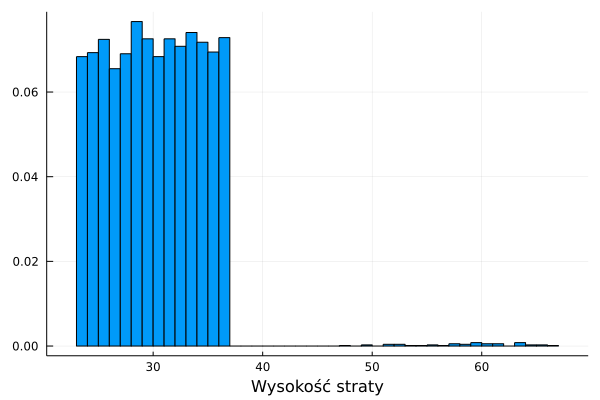

In [14]:
histogram(Xi, normed=true, label=false, xlabel="Wysokość straty") |> display

plt = plot!(dpi=500)
savefig(plt, "../fig/straty_1.pdf")

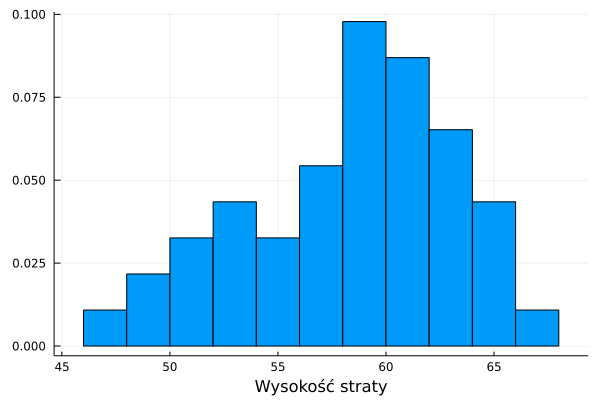

In [15]:
Xi_2 = [x for x in Xi if x > 40]
Xi_1 = [x for x in Xi if x < 40]

histogram(Xi_2, bins=10, normed=true, label=false, xlabel="Wysokość straty") |> display

plt = plot!(dpi=500)
savefig(plt, "../fig/straty_2.pdf")

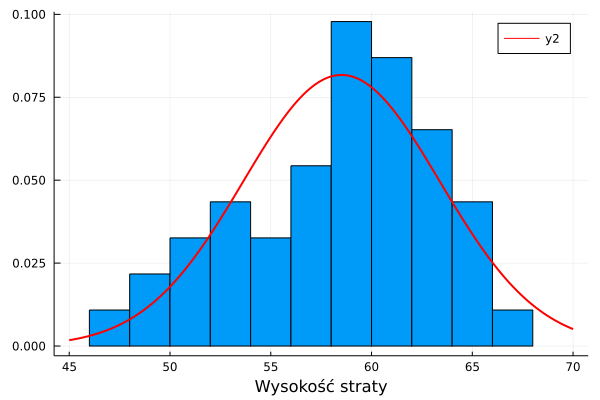

In [83]:
histogram(Xi_2, bins=10, normed=true, label=false, xlabel="Wysokość straty")

xs = 45:0.01:70
plot!(xs, pdf.(Normal(mean(Xi_2), std(Xi_2)), xs), color=:red, width=2)

In [28]:
minimum(Xi_1) |> println
maximum(Xi_1)

23.000435551170085


36.999978020931394

In [39]:
length(Xi_1)/length(Xi) |> println
length(Xi_2)/length(Xi)

0.9937483011687959


0.0062516988312041315

In [69]:
ExactOneSampleKSTest(Xi_1, Uniform(23, 37))

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.0119553

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.2449

Details:
    number of observations:   7312


In [52]:
m = mean(Xi_2)
σ = std(Xi_2)

4.881527730933858

In [30]:
ExactOneSampleKSTest(Xi_2, Normal(mean(Xi_2), std(Xi_2)))

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.0956093

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.7586

Details:
    number of observations:   46


In [34]:
ExactOneSampleKSTest(Xi_2, Normal(60, std(Xi_2)))

Exact one sample Kolmogorov-Smirnov test
----------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.126985

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.4140

Details:
    number of observations:   46


In [12]:
function heaviside(t, x0)
    return 0.5 * (sign(t - x0) + 1)
end


heaviside (generic function with 1 method)

In [107]:
T = 100
u = 50
c = (1 + θ) * μ * λ

plot()
for i in 1:50
    n = rand(Poisson(λ*T))
    τ = rand(Uniform(0, T), n)
    X = rand(Uniform(23, 37), n)
    R(t) = u + c*t - sum(X .* heaviside.(t, τ))

    xs = 0:0.01:T
    plot!(xs, R.(xs), color=:dodgerblue, alpha=0.6, label=false)
end

n = rand(Poisson(λ*T))
τ = rand(Uniform(0, T), n)
X = rand(Uniform(23, 37), n)
R(t) = u + c*t - sum(X .* heaviside.(t, τ))

xs = 0:0.01:T
plot!(xs, R.(xs), color=:dodgerblue, alpha=0.5, label="Trajektorie Rₜ")

plot!(xs, data[:,3], color=:blue, width=1, label="Trajektoria z danych")

xs = 0:0.01:100
plot!(xs, u .+ μ*λ*θ .* xs, color=:magenta, width=2, label=L"m(t)", xlabel=L"t", ylabel=L"R_t", legend=:topleft) |> display

plt = plot!(dpi=500)
savefig(plt, "../fig/trajektorie_2.png")

In [105]:
T = 100
p1 = 0.9937

counter = 0
N = 10000

for i in 1:N
    n = rand(Poisson(λ*T))
    τ = rand(Uniform(0, T), n)
    X = rand( MixtureModel( [Uniform(23, 37), Normal(m, σ)], [p1, 1-p1]), n)
    R(t) = u + c*t - sum(X .* heaviside.(t, τ))
    counter += sum(R.(τ .+ 0.0001) .< 0) >= 1
end

pΨ = counter/N

0.4194

In [59]:
function Ψ(u, N)
    
    Z = 0
    for i in 1:N
        K = rand(Geometric(θ/(1 + θ)))

        Y = Float64[]
        while length(Y) < K
            Ux = rand(Uniform(0, 37))
            Uy = rand(Uniform(0, 1/30))
            if Uy < f(Ux)
                append!(Y, Ux)
            end
        end

        if sum(Y) > u
            Z += 1
        end
    end

    return Z/N
end

Ψ (generic function with 1 method)

In [100]:
Ψ(50, 1000000)

0.420599

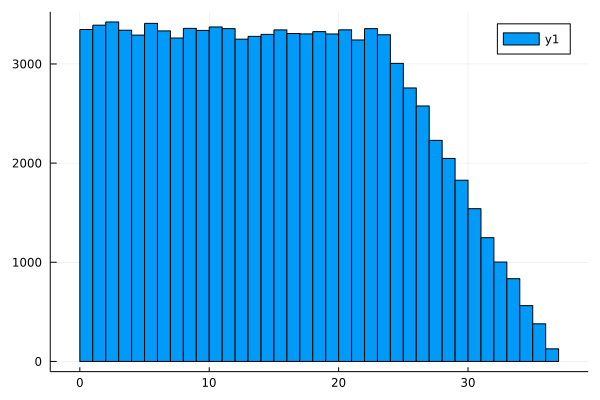

In [103]:
function f(x)
    if 0 < x < 23
        return 1/30
    elseif 23 < x < 37
        return (37 - x)/420
    else
        return 0
    end
end

Y = Float64[]
while length(Y) < 100000
    Ux = rand(Uniform(0, 37))
    Uy = rand(Uniform(0, 1/30))
    if Uy < f(Ux)
        append!(Y, Ux)
    end
end

histogram(Y)

In [ ]:
Ψ(10, 1000)

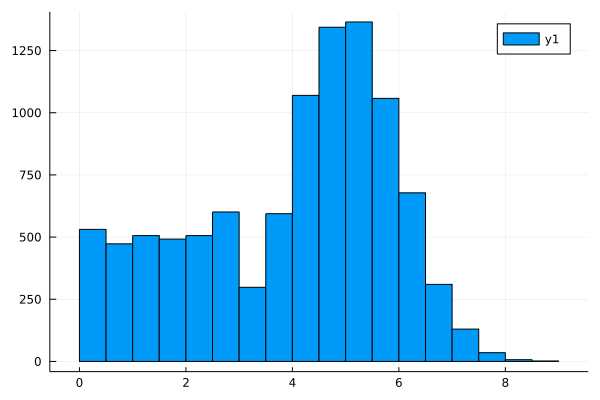

In [51]:
XXX = rand(MixtureModel([Uniform(0, 3), Normal(5, 1)], [0.3, 0.7]), 10000)
histogram(XXX)

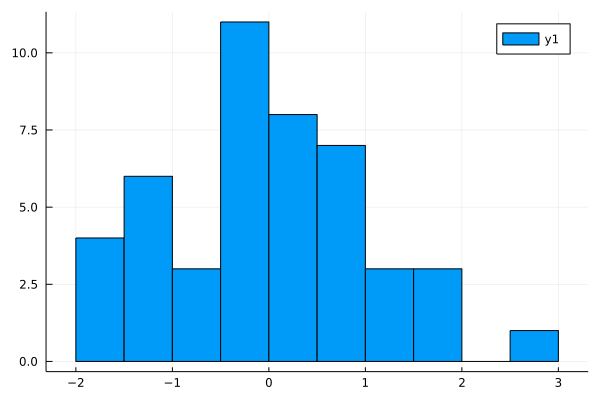

In [100]:
X = randn(46)
histogram(X, bins=10)